# IMPORTING NECESSARY LIBRARIES

In [1]:
using SparseArrays: spdiagm
using LinearAlgebra
using Plots
using Polynomials
using LaTeXStrings

# DEFINING NECESSARY FUNCTIONS
  

In [2]:
# Integrating Using Simpson Method 
# Take column vector as argument
function Simpson(fn,h)
    N = length(fn)
    sum = ( fn[1]+ fn[N] ) 
    
    for i=2:N-1
        sum+= (4-2*(i%2))*fn[i]
    end
    
    sum = h*sum/3
return sum
end

Simpson (generic function with 1 method)

In [3]:
#normalizing the function using Simpson method 

function Normalise(Psi,dx)
    return Psi/sqrt(Simpson([p*conj(p) for p in Psi],dx))
end

Normalise (generic function with 1 method)

# VERIFYING TABLE 1 for c_k

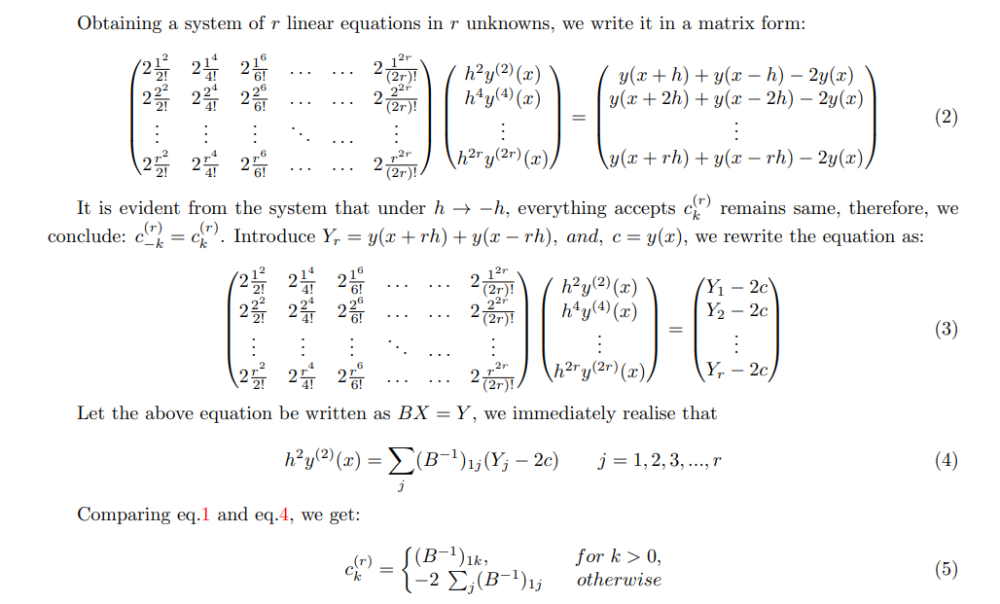

In [4]:
function Coefficients(r)
B = zeros(r,r)
for i =1:r
    for j =1:r
        B[i,j] = 2 * (i)^(2*j) / factorial(2*j)
    end
end  
Bi=B^-1;
colm=Bi*ones(r)*(-2);              #k=0 -> c_0 
ck =Bi[1,:];                       #c_k , k>0
return cat(colm[1],ck,dims=1)      #k=0 first
end

Coefficients (generic function with 1 method)

In [5]:
(Coefficients(2))

3-element Vector{Float64}:
 -2.5
  1.3333333333333333
 -0.08333333333333331

# TIME EVOLUTION OF WAVEFUNCTION

In [6]:
# Defining parameters

h = 1              # Plank's Constant
m = 1/2            # mass of particle

dx = 0.01          # spatial  step-size
dt = 0.05           # temporal step-size

L = 10             # range of position
x = 0:dx:L  
J = length(x)      # number of space intervals
N = 500            # number of time intervals

r=1                # defining r in 2r+1 formula
        

1

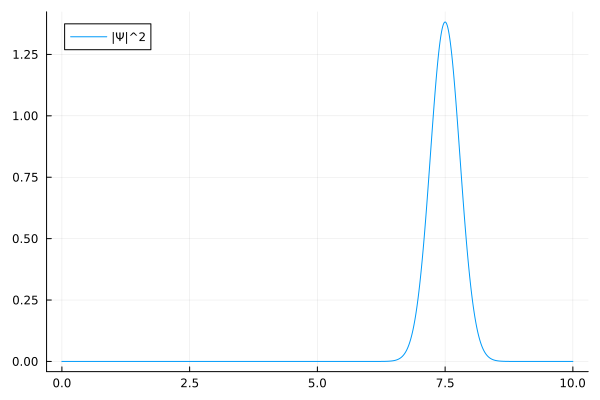

In [7]:
Psi = @. exp(-im*20*x)*exp(-3*(x-7.5)^2) #initial state vector
Psi = Normalise(Psi,dx)

#plot(x,real(conj(Psi).*Psi))
plot(x,abs.(conj(Psi).*Psi);label="|Ψ|^2")

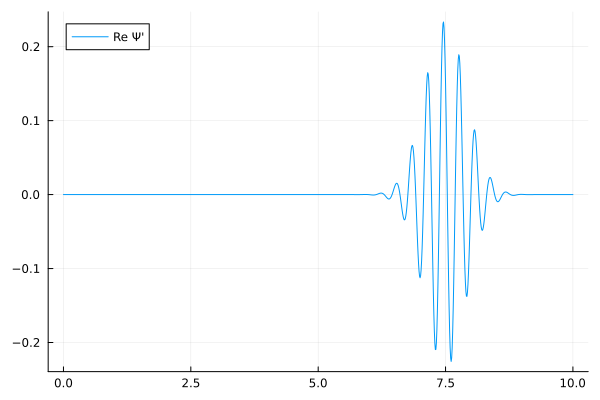

In [8]:
# Defining the first order derivative matrix
D =spdiagm(J,J, 1=> ones(J-1),0 => ones(J)*-1) ;
DPsi = D*Psi
plot(x,real.(DPsi);label="Re Ψ'")

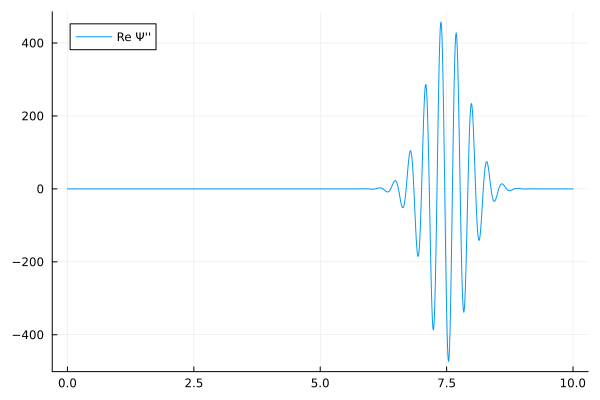

In [9]:
# Collecting the coefficient of second order derivative
c=Coefficients(r)

# Defining the second order derivative matrix
coeff=[c[abs(i)+1]*ones(J-abs(i)) for i=-r:r ] 
pos=collect(-r:r)
D2=spdiagm(J,J,(pos.=>coeff)...)/(dx^2)

D2Psi = D2*Psi
plot(x,real.(D2Psi);label="Re Ψ''")


In [10]:
#Defining the potential
#pot=@. x^2 #Harmonic oscillator
#pot=zeros(J)
#V=spdiagm(J,J,0=> pot)


#Defining A and Aconj
#A    = I(J)+(h/(4*m))*im*dt*(-D2+V)
#Atr =  I(J)-(h/(4*m))*im*dt*(-D2+V)

#Evolving the system
#PSI = zeros(J,N)
#PSI = complex(PSI)
#PSI[:,1] = Psi
#for i=2:N
#    rhs=Atr*Psi
#    sol = A\rhs
#    PSI[:,i] = sol
#    Psi = sol
#end

In [11]:
# Defining the potential
#pot=@. x^2 #Harmonic oscillator
pot=zeros(J)
V=spdiagm(J,J,0=> pot)

# Defining some constants
b = im*dt/(2*m)
z1 = -2

# Defining A and Aconj
A      = I(J) + (b/z1)*D2 -((im*dt/h)/z1)*V
Aconj  = conj(A)

# Evolving the system
PSI = zeros(J,N)
PSI = complex(PSI)
PSI[:,1] = Psi
for i=2:N
    rhs=Aconj*Psi
    sol = A\rhs
    PSI[:,i] = sol
    Psi = sol
end

In [12]:
#for i=1:N
 #   plot(x,abs.(conj(PSI[:,i]).*PSI[:,i]))
  #  savefig("C:\\Users\\shubh\\Downloads\\Tests\\5\\Psi"*string(i)*".png")
#end

## ANIMATING TIME EVOLUTION OF WAVEFUNCTION

[ Info: Saved animation to C:\Users\shubh\Downloads\Wavefunc_evol.gif


Plots.AnimatedGif("C:\\Users\\shubh\\Downloads\\Wavefunc_evol.gif")
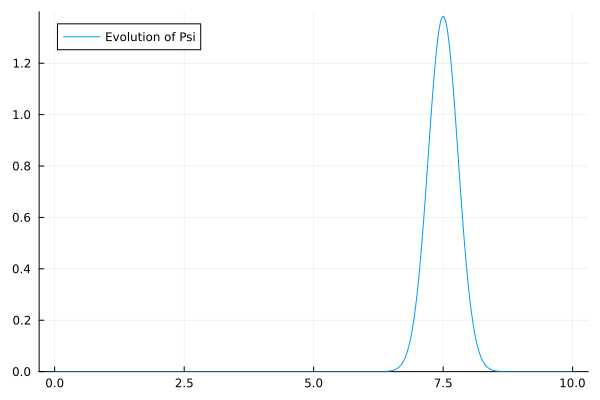

In [13]:
anim = @animate for i = 1:N
   plot(x,abs.(conj(PSI[:,i]).*PSI[:,i]);label="Evolution of Psi",ylimit = (0,1.4))
end

gif(anim, "Wavefunc_evol.gif", fps = 50)

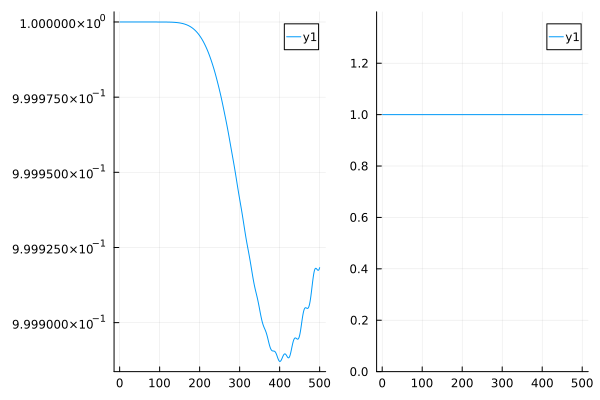

In [14]:
Norm = zeros(N)
for i = 1:N
    y = abs.(conj(PSI[:,i]).*PSI[:,i])
    Norm[i] = Simpson(y,dx)
end

p1 = plot(collect(1:N),Norm);
p2 = plot(collect(1:N),Norm,ylimit = (0,1.4));
plot(p1,p2, layout = (1,2))

# PADE APPROXIMANT

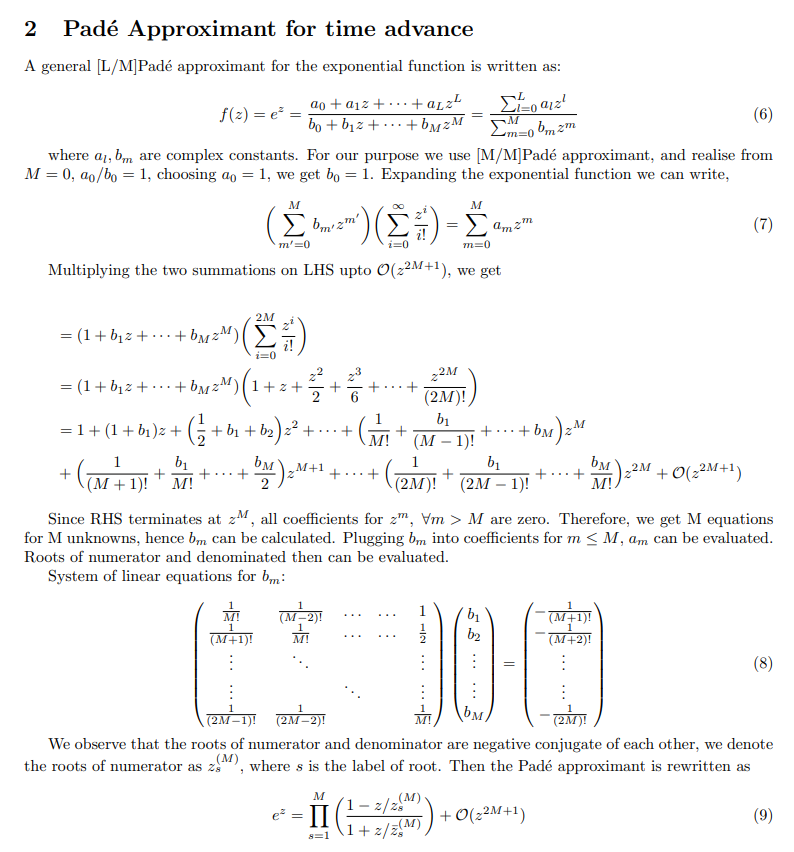

In [15]:
# Defining M in [M/M] Pade approximant of the exponential function

function roots_Pade(M)   # returns Roots of Numerator of Pade approximant for M/M
    X = zeros(M,M)
    B = zeros(1,M)
    A = zeros(M,1)
    for i = 1:M
        m = M + i 
        A[i,1] = -1/factorial(m) 
        for j = 1:M
            m = m - 1
            X[i,j] = 1/(factorial(m))
        end
    end
    B = inv(X)*A;
    
    Poly = Polynomial([1;B], :z)           # Polynomial for Denominator in Pade
    R = roots(Poly);                       # roots of Denominator
    R = -conj(R)                           # roots of Numerator
    return R
end

roots_Pade (generic function with 1 method)

# SOLUTION USING PADE APPROXIMATION

In [16]:
M = 2 # Defining value of M in Pade approximation
roots_list = roots_Pade(M)   

2-element Vector{ComplexF64}:
 -3.0000000000000004 - 1.732050807568879im
 -3.0000000000000004 + 1.732050807568879im

In [17]:
#pot=@. x^2 #Harmonic oscillator
pot=zeros(J)
V=spdiagm(J,J,0=> pot)
dt = 0.1
b = im*dt/(2*m)
Psi = @. exp(-im*20*x)*exp(-3*(x-7.5)^2) #initial state vector
Psi = Normalise(Psi,dx)
PSI = zeros(J,N)
PSI = complex(PSI)
PSI[:,1] = Psi

for i=2:N
    for s=1:M
        # Defining A and Aconj
        A      = I(J) + (b/roots_list[s])*D2 -((im*dt/h)/roots_list[s])*V
        Aconj  = conj(A)
        
        # Finding Psi(n+1)
        rhs = Aconj*Psi
        sol = A\rhs
        Psi = sol
    end
    PSI[:,i] = Psi
end

## <b>DECAY RATE DEPENDENT ON M, choose larger value of dt if decay is very fast </b>

[ Info: Saved animation to C:\Users\shubh\Downloads\Wavefunc_evol_Pade.gif


Plots.AnimatedGif("C:\\Users\\shubh\\Downloads\\Wavefunc_evol_Pade.gif")
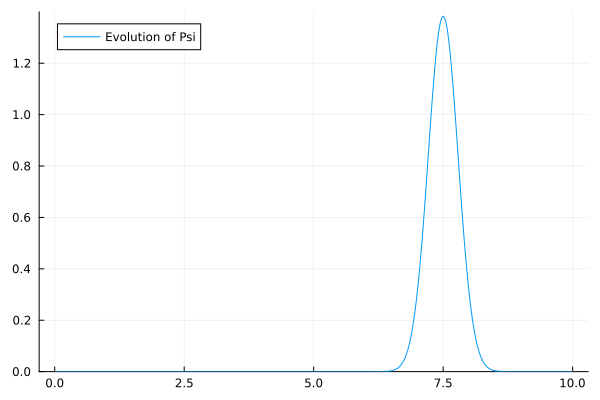

In [18]:
anim = @animate for i = 1:N
   plot(x,abs.(conj(PSI[:,i]).*PSI[:,i]);label="Evolution of Psi",ylimit = (0,1.4))
end

gif(anim, "Wavefunc_evol_Pade.gif", fps = 50)
    
## DECAY RATE DEPENDENT ON M, choose larger value of dt if decay is very fast ##